# Find the central star of CTIO Data in May 2017
==================================================================================================

- author : Jérémy Neveu
- date   : May 31st 2017


The goal of this notebook is to cut a part of the image around the main central star.
The rest of the image is useless.
This region around the central star is necessary to perform the rotation of the images without
any biases due to other stars.


In [3]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [4]:
print theNotebook

FindCentralStar


In [5]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

from astropy.modeling import models
from astropy import units as u
from astropy import nddata
from astropy.io import fits
import re
import os

In [6]:
import ccdproc
print 'ccdproc version',ccdproc.__version__

from astropy.modeling import models

ccdproc version 1.2.0


In [7]:
from scipy import stats  
from scipy import ndimage
from datetime import datetime, timedelta
from mpl_toolkits.mplot3d import Axes3D
import scipy.signal

In [8]:
import bottleneck as bn  # numpy's masked median is slow...really slow (in version 1.8.1 and lower)
print 'bottleneck version',bn.__version__

bottleneck version 1.2.0


In [9]:
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind
from photutils import CircularAperture
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
#from photutils.background import Background2D
from photutils import Background2D, SigmaClip, MedianBackground

In [10]:
%load_ext Cython

In [11]:
from IPython.display import Image, display

In [12]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

In [13]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (4, 4),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [14]:
############################################################################
def ensure_dir(f):
    d = os.path.dirname(f)
    if not os.path.exists(f):
        os.makedirs(f)
#########################################################################

### Output directory for images generated in the notebook view (not true fits images)¶

In [15]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images

In [16]:
ensure_dir(dir_top_images) # create that directory

### Input directory

In [17]:
!ls ../OverScanRemove/trim_images

trim_20170609_004.fits trim_20170609_064.fits trim_20170609_122.fits
trim_20170609_005.fits trim_20170609_065.fits trim_20170609_123.fits
trim_20170609_006.fits trim_20170609_066.fits trim_20170609_124.fits
trim_20170609_007.fits trim_20170609_067.fits trim_20170609_125.fits
trim_20170609_008.fits trim_20170609_068.fits trim_20170609_126.fits
trim_20170609_009.fits trim_20170609_069.fits trim_20170609_127.fits
trim_20170609_010.fits trim_20170609_070.fits trim_20170609_128.fits
trim_20170609_011.fits trim_20170609_071.fits trim_20170609_129.fits
trim_20170609_012.fits trim_20170609_072.fits trim_20170609_130.fits
trim_20170609_013.fits trim_20170609_073.fits trim_20170609_131.fits
trim_20170609_014.fits trim_20170609_074.fits trim_20170609_132.fits
trim_20170609_015.fits trim_20170609_075.fits trim_20170609_133.fits
trim_20170609_016.fits trim_20170609_076.fits trim_20170609_134.fits
trim_20170609_017.fits trim_20170609_077.fits trim_20170609_135.fits
trim_20170609_018.fits trim_201706

In [18]:
inputdir="../OverScanRemove/trim_images"
MIN_IMGNUMBER=156
MAX_IMGNUMBER=180
object_name='HD205905'
SelectTagRe='^trim_20170609_([0-9]+).fits$' # regular expression to select the file
SearchTagRe='^trim_20170609_[0-9]+.fits$'
NBIMGPERLROW=4

### Output directory fot fits images

In [19]:
outputdir="./cut_fitsimages"

In [20]:
ensure_dir(outputdir)

## Location of corrected images
----------------------------------

In [21]:
input_filelist=os.listdir(inputdir) 

In [22]:
if '.DS_Store' in input_filelist:
    input_filelist.remove('.DS_Store')
input_filelist=np.array(input_filelist)

In [23]:
print input_filelist[:5]

['trim_20170609_004.fits' 'trim_20170609_005.fits' 'trim_20170609_006.fits'
 'trim_20170609_007.fits' 'trim_20170609_008.fits']


In [24]:
indexes_files= [] # global list
filelist_fitsimages= []  # global list
dirlist_all = [inputdir]

In [25]:
def MakeFileList():
    """
    MakeFileList : Make The List of files to open
    =============
    
    - we select the files which are of interest.
    - In particular select the number range
    
    """
    count=0
    
    for dir in dirlist_all: # loop on directories, one per image   (if necessary)    
            dir_leaf= dir # build the name of leaf directory
            listfiles=os.listdir(dir_leaf) 
            for filename in listfiles:
                if re.search(SearchTagRe,filename):  #example of filename filter
                    str_index=re.findall(SelectTagRe,filename)
                    count=count+1
                    index=int(str_index[0])
                    if index >= MIN_IMGNUMBER and index <= MAX_IMGNUMBER: 
                        indexes_files.append(index)         
                        shortfilename=dir_leaf+'/'+filename
                        filelist_fitsimages.append(shortfilename)
                    
    return 

In [26]:
MakeFileList()   # Make the list

In [27]:
indexes_files=np.array(indexes_files)
filelist_fitsimages=np.array(filelist_fitsimages)

In [28]:
sorted_indexes=np.argsort(indexes_files) # sort the file indexes

In [29]:
sorted_numbers=indexes_files[sorted_indexes]

In [30]:
#sorted_files= [filelist_fitsimages[index] for index in sorted_indexes] # sort files
sorted_files=filelist_fitsimages[sorted_indexes]

## Build full filename
----------------------------

In [31]:
sorted_filenames=[]
for file in sorted_files:
    #fullfilename=os.path.join(inputdir,file)
    fullfilename=file
    sorted_filenames.append(fullfilename)

In [32]:
#sorted_filenames=np.array(sorted_filenames)
sorted_filenames=np.copy(sorted_files)

## Acces to data of  images
----------------------------------

In [33]:
all_dates = []
all_airmass = []
all_images = []
all_titles = []
all_header = []
all_img = []
all_filt = []

In [34]:
%%cython

import numpy as np
from astropy.io import fits

def BuildImages(sorted_filenames,sorted_numbers,object_name):
    """
    BuildRawImages
    ===============
    """

    
    all_dates = []
    all_airmass = []
    all_images = []
    all_titles = []
    all_header = []
    all_filt = []
   
    NBFILES=sorted_filenames.shape[0]

    for idx in range(NBFILES):  
        
        file=sorted_filenames[idx]    
        
        hdu_list=fits.open(file)
        header=hdu_list[0].header
        #print header
        date_obs = header['DATE-OBS']
        airmass = header['AIRMASS']
        filters = header['FILTERS']
    
        num=sorted_numbers[idx]
        title=object_name+" z= {:3.2f} Nb={}".format(float(airmass),num)
        image_corr=hdu_list[0].data
        image=image_corr
        
        all_dates.append(date_obs)
        all_airmass.append(float(airmass))
        all_images.append(image)
        all_titles.append(title)
        all_header.append(header)
        all_filt.append(filters)
        hdu_list.close()
        
    return all_dates,all_airmass,all_images,all_titles,all_header,all_filt

In [35]:
all_dates,all_airmass,all_images,all_titles,all_header,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

In [36]:
#all_filt

## Show images
-----------------------

In [37]:
len(all_images)

25

In [38]:
def ShowRawImages():
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    #global all_images
    #global all_titles
    #global object_name

    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/NBIMGPERLROW)+1

    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERLROW,figsize=(25,5*MAXIMGROW))
    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERLROW
        iy=index/NBIMGPERLROW
        #im=axarr[iy,ix].imshow(all_images[index],origin='lower',cmap='rainbow',norm=LogNorm(vmin=0.1, vmax=10))
        im=axarr[iy,ix].imshow(all_images[index],origin='lower',cmap='rainbow',vmin=0, vmax=20)
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(color='white', ls='solid')
        axarr[iy,ix].text(1000.,1700,all_filt[index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)
    title='Raw images of {}'.format(object_name)
    plt.suptitle(title,size=16)    
    figfilename=os.path.join(dir_top_images,'input_images.pdf')
    plt.savefig(figfilename)   

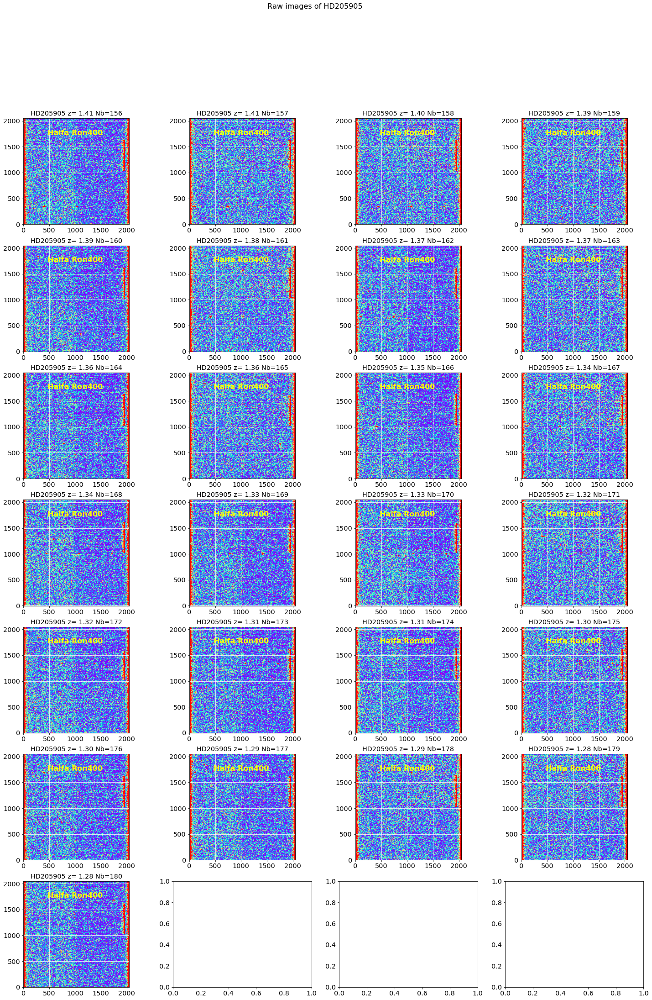

In [39]:
ShowRawImages()

### Find the star locations
----------------------------

In [40]:
%%cython
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind

def ComputeStatImages(all_images):
    """
    ComputeStatImages: 
    ==============
    """
    
    img_mean=[]
    img_median=[]
    img_std=[]
    img_sources=[]
    img_=[]
    index=0
    for image in all_images:
        mean, median, std = sigma_clipped_stats(image, sigma=10.0, iters=5)    
        print '----------------------------------------------------------------'
        print index,' mean, median, std = ',mean, median, std
        img_mean.append(mean)
        img_median.append(median)
        img_std.append(std)
        sources = daofind(image - median, fwhm=30, threshold=10*std) # (JN) valeurs optimisées pour cette étude
        print sources
        img_sources.append(sources)    
        index+=1
    return img_mean,img_median,img_std,img_sources

In [41]:
#img_mean,img_median,img_std,img_sources=ComputeStatImages(all_images)

In [42]:
%%cython
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind
import numpy as np
import matplotlib.pyplot as plt

def ComputeStatImagesWithGuess(all_images,guess_positions):
    """
    ComputeStatImages: 
    ==============
    """
    w=200 # size of the window in pixel
    
    img_mean=[]
    img_median=[]
    img_std=[]
    x_star = []
    y_star = []
    img_=[]
    NBIMGPERLROW = 4
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/NBIMGPERLROW)+1

    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERLROW,figsize=(25,5*MAXIMGROW))
    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERLROW
        iy=index/NBIMGPERLROW
        xguess = guess_positions[index][1]
        yguess = guess_positions[index][0]
        sub = all_images[index][yguess-w:yguess+w,xguess-w:xguess+w]

        mean, median, std = sigma_clipped_stats(all_images[index], sigma=10.0, iters=5)    # (JN) valeurs optimisées pour cette étude
        print '----------------------------------------------------------------'
        print index,' mean, median, std = ',mean, median, std
        #img_mean.append(mean)
        #img_median.append(median)
        #img_std.append(std)
        sources = daofind(sub - median, fwhm=7, threshold=200*std) # (JN) valeurs optimisées pour cette étude
        print sources
        axarr[iy,ix].imshow(sub,origin='lower',cmap='rainbow',vmin=0, vmax=20)
        #axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(color='white', ls='solid')
        #axarr[iy,ix].text(1000.,1700,all_filt[index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)
        max_loc = np.where(sub==np.max(sub))
        print 'Max localisation: ',max_loc[1],max_loc[0]
        #x_star.append()
        axarr[iy,ix].scatter(max_loc[1],max_loc[0],s=200,facecolor='red')
        #img_sources.append(sources)  
        x_star.append(sources[0]["xcentroid"]+xguess-w)
        y_star.append(sources[0]["ycentroid"]+yguess-w)
        axarr[iy,ix].scatter([sources[0]["xcentroid"]],[sources[0]["ycentroid"]],s=200,facecolor='black')
    x_star = np.array(x_star).astype(int)
    y_star = np.array(y_star).astype(int)
    plt.show()

    return img_mean,img_median,img_std,x_star, y_star

----------------------------------------------------------------
0  mean, median, std =  5.06149286931 4.0 8.73459409267
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- --------------
  1 263.911640104 196.457656176 ... 14815.0 11.6969254259 -2.67017930264
  2 268.368109267 196.713390745 ... 18599.0 15.5751691328 -2.98108192855
Max localisation:  [269] [197]


        Use DAOStarFinder instead. [astropy.utils.decorators]


----------------------------------------------------------------
1  mean, median, std =  6.0984124068 5.0 8.77281562567
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- --------------
  1 269.244251764 195.461076635 ... 24898.0 21.5489735297 -3.33356646919
  2 261.493770964 195.538531018 ... 10903.0 8.96702639947 -2.38162112087
Max localisation:  [269] [195]
----------------------------------------------------------------
2  mean, median, std =  6.10277817808 5.0 8.77631874972
 id  xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------ ------------- ... ------- ------------- --------------
  1 269.51884317 195.918925301 ... 27892.0 23.4204032914 -3.42398592301
Max localisation:  [270] [196]
----------------------------------------------------------------
3  mean, median, std =  5.74049959415 5.0 8.77486915104
 id   xcentroid     ycentroid   ...   peak       flux          mag  

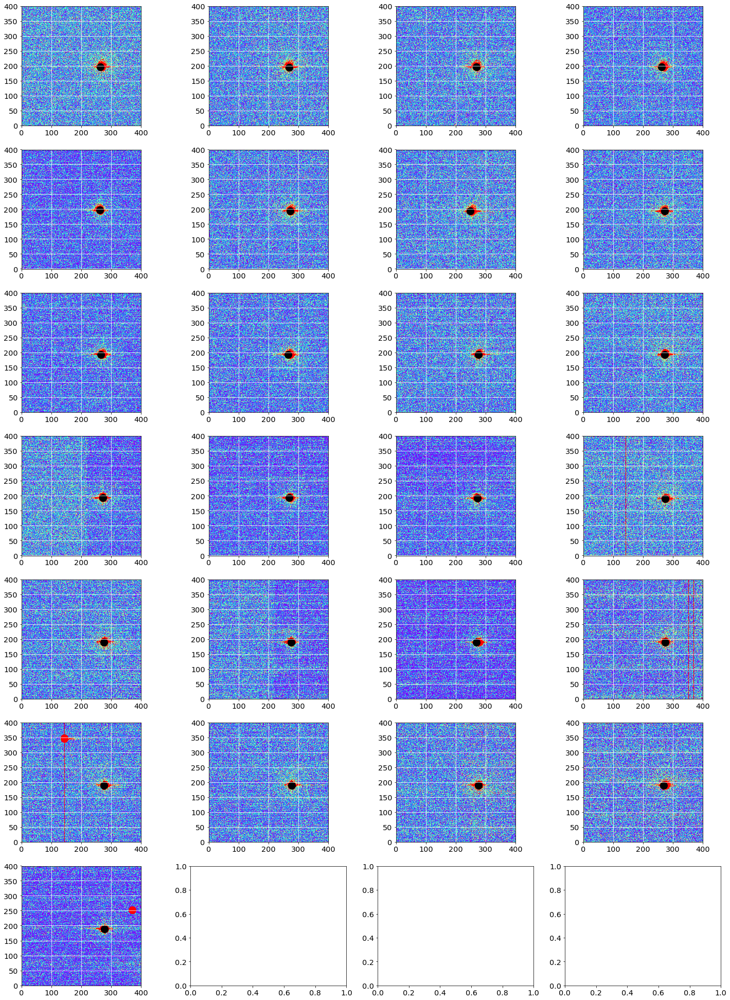

In [43]:
textfilename = '../ScanRon400_FGB37/cut_fitsimages/star_centroids.txt'
guess = (np.loadtxt(textfilename)).astype(int)

img_mean,img_median,img_std,x_star,y_star=ComputeStatImagesWithGuess(all_images,guess)

### Central star position

In [44]:
# Default position
print x_star
print y_star
print guess.T
x0 = x_star[len(x_star)/2]
y0 = y_star[len(y_star)/2]

[ 398  740 1076 1403 1741  405  733 1078 1406 1743  406  741 1077 1410 1751
  405  743 1078 1407 1752  405  744 1079 1410 1752]
[ 338  337  336  336  336  670  669  668  668  668 1004 1003 1003 1003 1002
 1339 1337 1337 1337 1336 1673 1673 1672 1672 1672]
[[ 342  342  341  341  340  676  676  675  675  675 1011 1011 1010 1010
  1010 1349 1348 1348 1348 1347 1684 1683 1683 1683 1683]
 [ 335  671 1007 1342 1679  333  686 1006 1342 1677  331  669 1006 1342
  1678  332  668 1004 1339 1677  330  668 1004 1341 1675]]


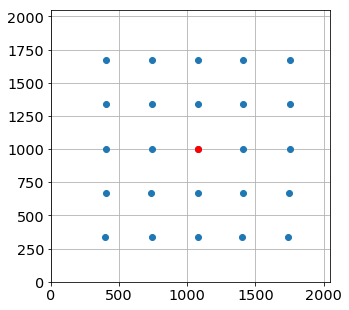

In [45]:
img_size=all_images[0].shape
plt.figure(figsize=(5,5))
plt.plot(x_star,y_star,'o')
plt.plot(x0,y0,'ro')
plt.xlim(0,img_size[1])
plt.ylim(0,img_size[0])
plt.grid(True)

### Cut the image

In [46]:
DeltaY=100
DeltaX=600

In [47]:
#%%cython

import numpy as np
import matplotlib.pyplot as plt
from photutils import CircularAperture
import os

def ShowCenterImages(all_images,all_titles,object_name,dir_top_images):
    """
    ShowCenterImages: Show the raw images without background subtraction
    ==============
    """
    NBIMAGES=len(all_images)
    NBIMGPERLROW = 2
    MAXIMGROW=int(NBIMAGES/NBIMGPERLROW)+1
    
    #global dir_top_images
    
    croped_images = []
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERLROW,figsize=(25,5*MAXIMGROW))
    for index in np.arange(0,NBIMAGES):
        ix=index%NBIMGPERLROW
        iy=index/NBIMGPERLROW
        x0 = x_star[index]
        y0 = y_star[index]
       
        #image_cut=all_images[index][y0-200:y0+200,x0-200,y0+200]
        theimage=all_images[index]
        #image_cut=theimage[y0-DeltaY:y0+DeltaY,x0-DeltaX:x0+DeltaX]
        image_cut=np.copy(theimage[y0-DeltaY:y0+DeltaY,:])
        croped_images.append(image_cut)
        #aperture=CircularAperture([positions_central[index]], r=100.)
        im=axarr[iy,ix].imshow(image_cut,cmap='rainbow',vmin=0,vmax=1000,aspect='auto',origin='lower',interpolation='None')
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(color='white', ls='solid')
        #aperture.plot(color='red', lw=5.)
    title='Cut Images of {}'.format(object_name)
    plt.suptitle(title,size=16) 
    
    figfilename=os.path.join(dir_top_images,'cut_images.pdf')
    plt.savefig(figfilename)   
    
    
    return croped_images

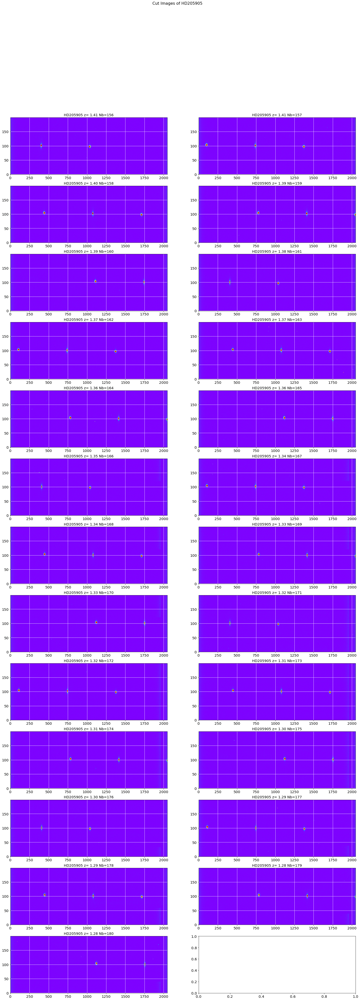

In [48]:
images_cut=ShowCenterImages(all_images,all_titles,object_name,dir_top_images)

#### Example of cut image
-------------------------

In [49]:
index=0
data=np.copy(images_cut[index])
w=20
ws=80
data[:,DeltaX-ws:DeltaX+ws]=0

In [50]:
yprofile=np.sum(data,axis=1)
xprofile=np.sum(data,axis=0)

In [51]:
y_center=np.where(yprofile==yprofile.max())[0][0]
print y_center

101


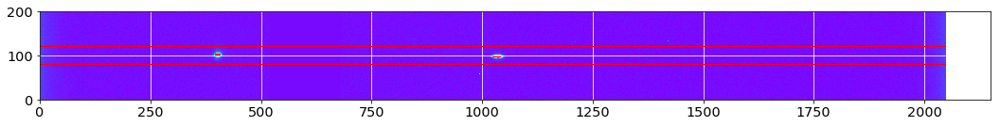

In [52]:
plt.figure(figsize=(18,18))
plt.imshow(data,vmin=-10,vmax=800,origin='lower',cmap='rainbow',interpolation='None')
plt.plot([0,data.shape[1]],[y_center-w,y_center-w],'r-',lw=1)
plt.plot([0,data.shape[1]],[y_center+w,y_center+w],'r-',lw=1)
plt.grid(color='white', ls='solid')
plt.show()
figfilename=os.path.join(dir_top_images,'cutimages_sample.pdf')
plt.savefig(figfilename)   

### prepare outputfilename

In [53]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    
    short_infilename=file.split("/")[3]
    print short_infilename
    short_partfilename=re.findall('^trim_(.*)',short_infilename)
    short_outfilename='cutimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

trim_20170609_156.fits
trim_20170609_157.fits
trim_20170609_158.fits
trim_20170609_159.fits
trim_20170609_160.fits
trim_20170609_161.fits
trim_20170609_162.fits
trim_20170609_163.fits
trim_20170609_164.fits
trim_20170609_165.fits
trim_20170609_166.fits
trim_20170609_167.fits
trim_20170609_168.fits
trim_20170609_169.fits
trim_20170609_170.fits
trim_20170609_171.fits
trim_20170609_172.fits
trim_20170609_173.fits
trim_20170609_174.fits
trim_20170609_175.fits
trim_20170609_176.fits
trim_20170609_177.fits
trim_20170609_178.fits
trim_20170609_179.fits
trim_20170609_180.fits


### Save outputfilename

In [55]:
for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_cut[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,overwrite=True)
textfilename=os.path.join(outputdir,'star_centroids.txt')
print textfilename
np.savetxt(textfilename,np.array([y_star, x_star]).T,header="y_star x_star",fmt='%d')

./cut_fitsimages/star_centroids.txt


In [56]:
for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_cut[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,overwrite=True)

In [57]:
!ls -l cut_fitsimages/*

-rw-r--r--  1 jneveu  staff  3288960 10 jui 11:57 cut_fitsimages/cutimg_20170609_156.fits
-rw-r--r--  1 jneveu  staff  3288960 10 jui 11:57 cut_fitsimages/cutimg_20170609_157.fits
-rw-r--r--  1 jneveu  staff  3288960 10 jui 11:57 cut_fitsimages/cutimg_20170609_158.fits
-rw-r--r--  1 jneveu  staff  3288960 10 jui 11:57 cut_fitsimages/cutimg_20170609_159.fits
-rw-r--r--  1 jneveu  staff  3288960 10 jui 11:57 cut_fitsimages/cutimg_20170609_160.fits
-rw-r--r--  1 jneveu  staff  3288960 10 jui 11:57 cut_fitsimages/cutimg_20170609_161.fits
-rw-r--r--  1 jneveu  staff  3288960 10 jui 11:57 cut_fitsimages/cutimg_20170609_162.fits
-rw-r--r--  1 jneveu  staff  3288960 10 jui 11:57 cut_fitsimages/cutimg_20170609_163.fits
-rw-r--r--  1 jneveu  staff  3288960 10 jui 11:57 cut_fitsimages/cutimg_20170609_164.fits
-rw-r--r--  1 jneveu  staff  3288960 10 jui 11:57 cut_fitsimages/cutimg_20170609_165.fits
-rw-r--r--  1 jneveu  staff  3288960 10 jui 11:57 cut_fitsimages/cutimg_20170609_166.fits
-rw-r--r--